In [38]:
import pandas as pd

# Read in the data
df = pd.read_csv('testdata/data.csv', names=['label', 'text'], delimiter=',')
df_wiki = pd.read_csv('testdata/data_wiki.csv', names=['label', 'text'], delimiter='\t')
df.head()
# df_wiki.head()

,label,text
0,culture,indigenous woman chile teaches aymara ancestry...
1,culture,arabia difference etiquette wearing slippers l...
2,culture,slow look around patient means embracing thing...
3,culture,culturescountries outside usa western europe v...
4,culture,fake government birds heard right couldnt beli...


In [39]:
#clean text
import re
import string

def clean_text(text):
    # print(text)
    text = text.lower()
    text = re.sub('['+string.punctuation+']', '', text)
    return text

df['text'] = df['text'].apply(lambda x: clean_text(x))
df_wiki['text'] = df_wiki['text'].apply(lambda x: clean_text(x))

# lowercase all labels
df['label'] = df['label'].apply(lambda x: x.lower())
df_wiki['label'] = df_wiki['label'].apply(lambda x: x.lower())

dfall = pd.concat([df, df_wiki], ignore_index=True)
dfall.head()

,label,text
0,culture,indigenous woman chile teaches aymara ancestry...
1,culture,arabia difference etiquette wearing slippers l...
2,culture,slow look around patient means embracing thing...
3,culture,culturescountries outside usa western europe v...
4,culture,fake government birds heard right couldnt beli...


culture


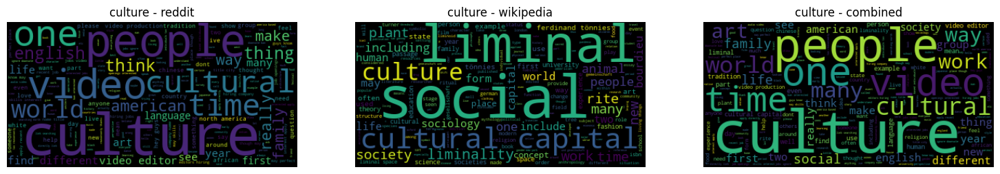

entertainment


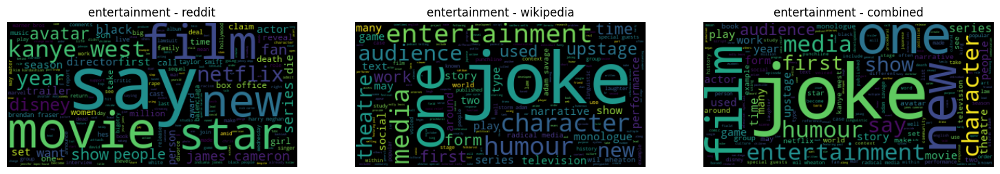

news


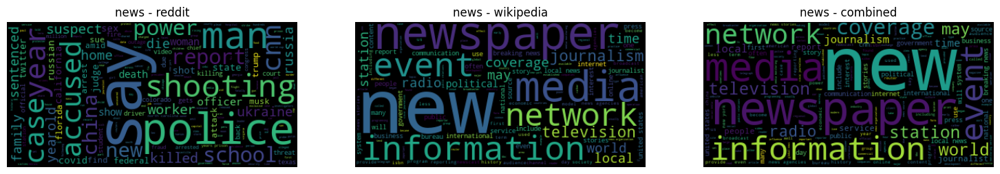

philosophy


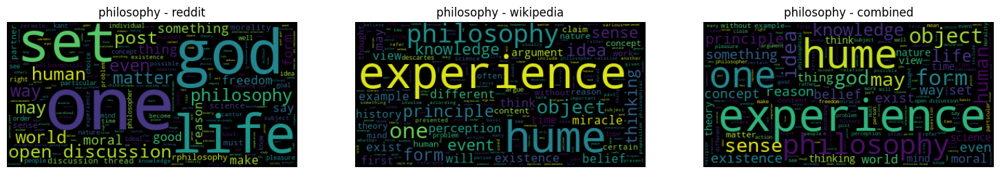

religion


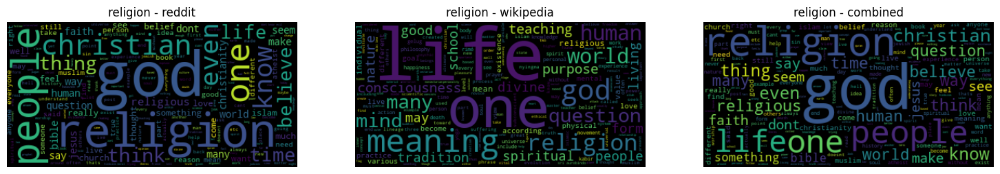

science


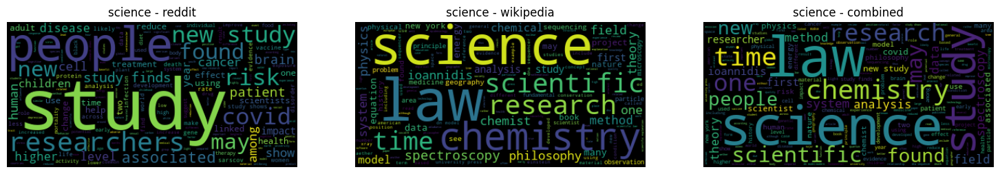

sports


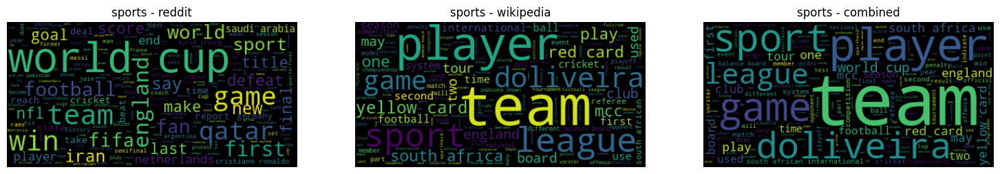

technology


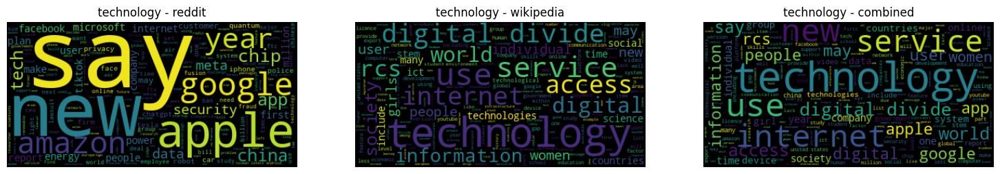

law


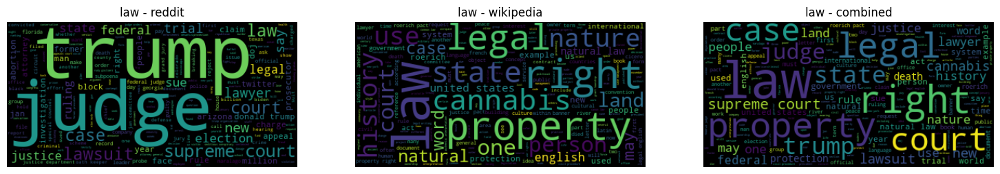

history


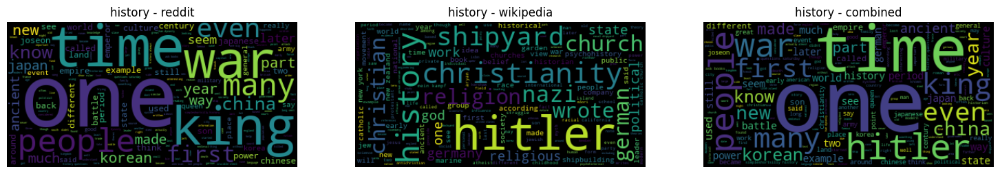

geography


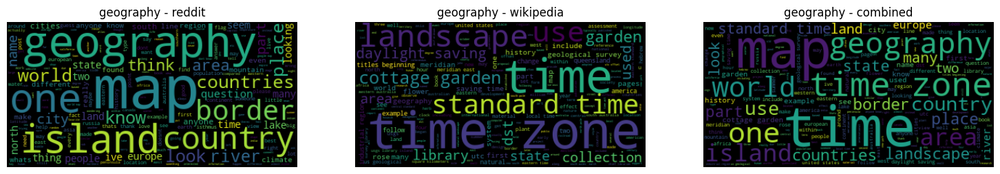

videogames


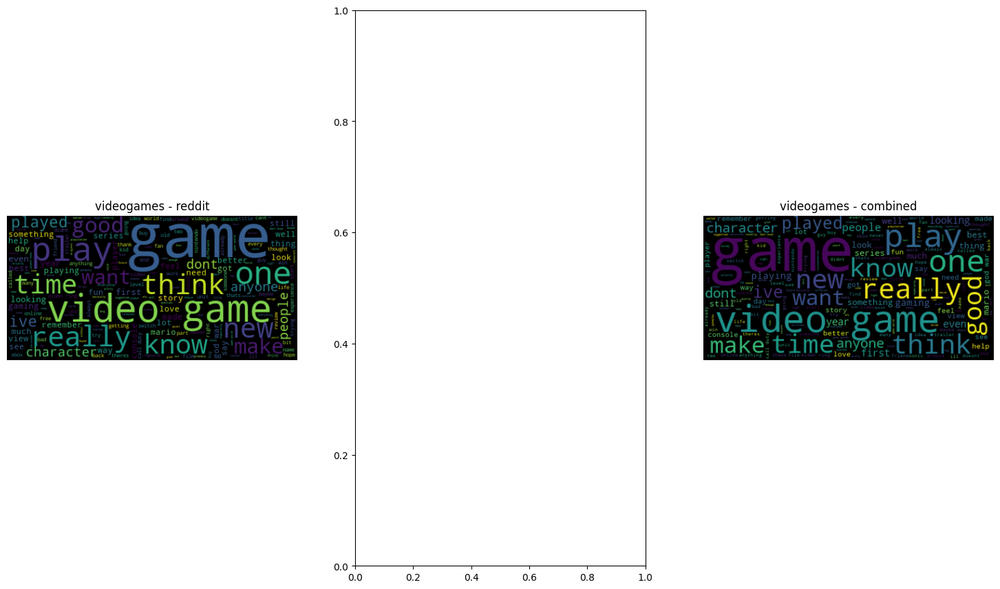

music


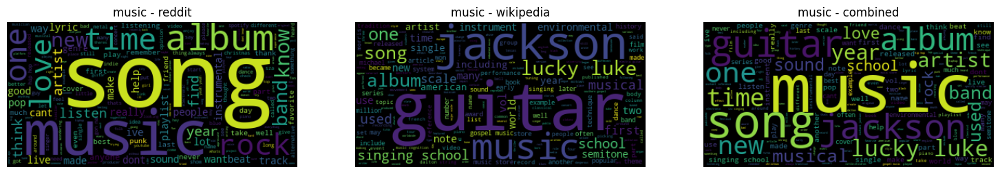

medicine


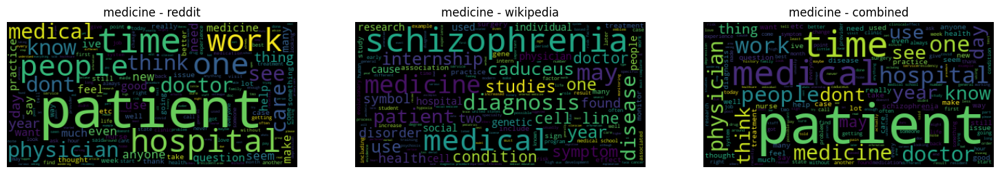

business


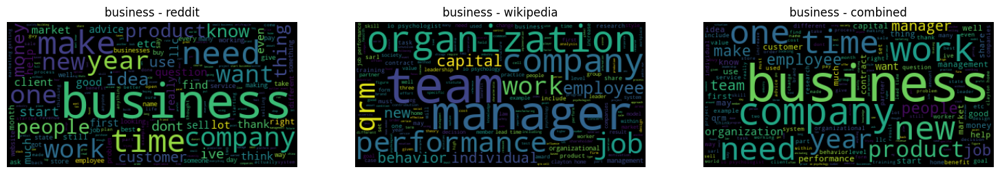

foods


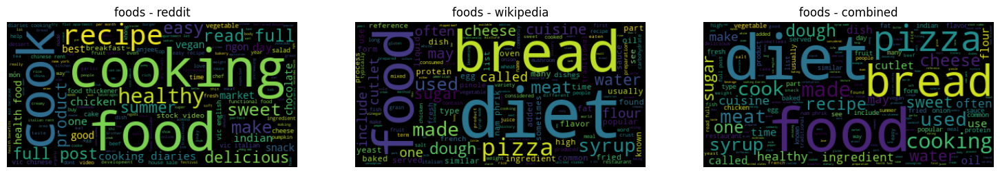

disasters


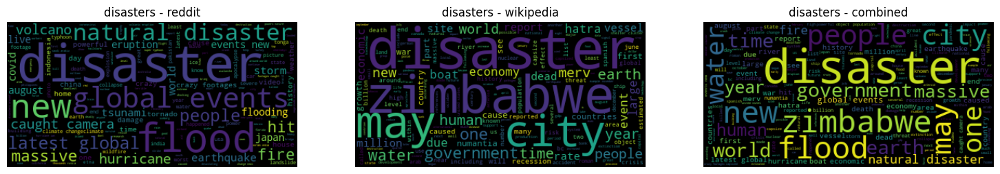

nature


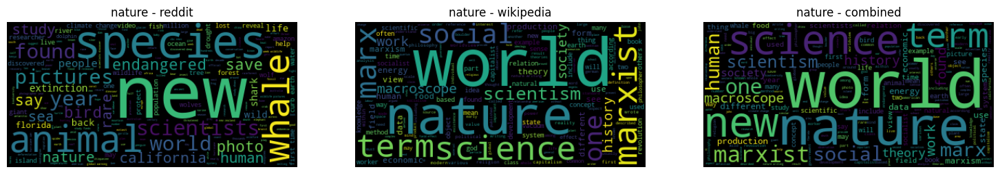

education


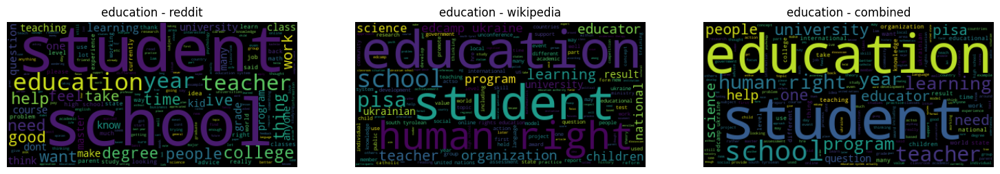

politics


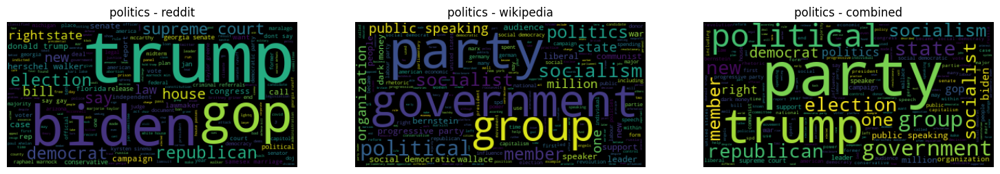

economics


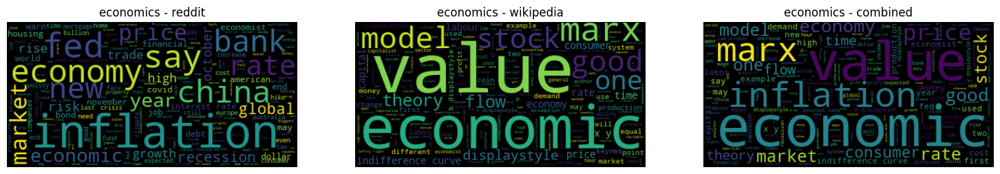

computerscience


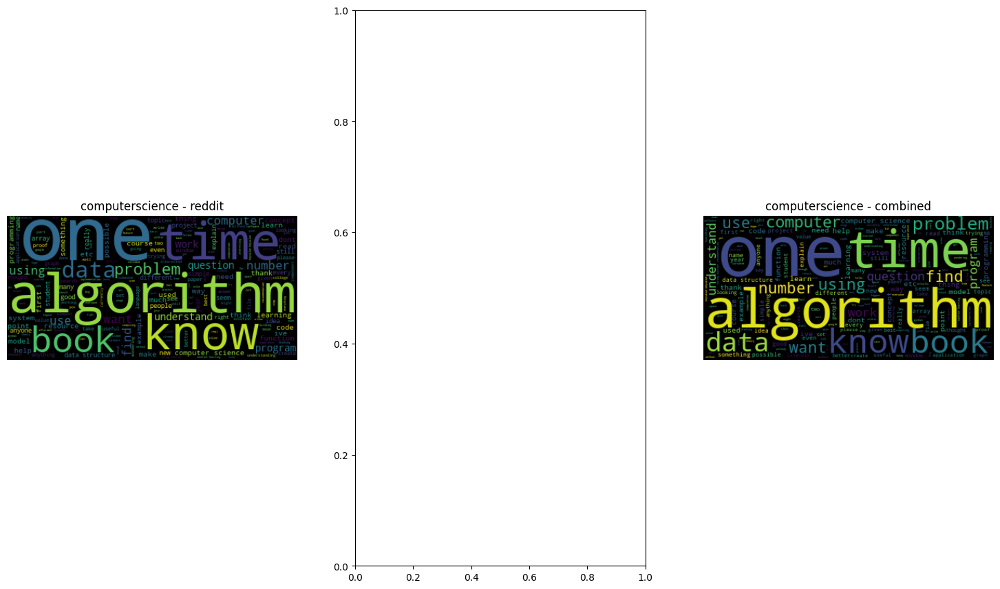

mathematics


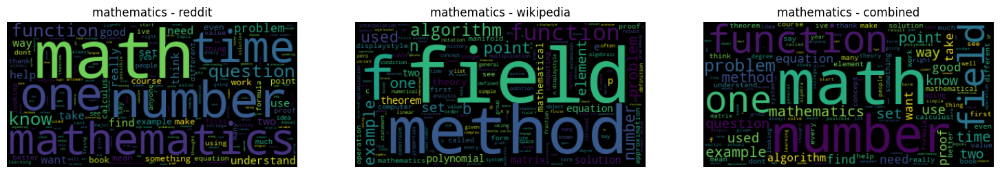

In [47]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Create 3 wordclouds for each label display on same plot
for label in df.label.unique():
    print(label)
    text = ' '.join(df[df.label == label].text)
    text2 = ' '.join(df_wiki[df_wiki.label == label].text)
    text3 = ' '.join(dfall[dfall.label == label].text)
    wordcloud = WordCloud().generate(text)
    f, axarr = plt.subplots(1,3)
    axarr[0].imshow(wordcloud, interpolation='bilinear')
    axarr[0].set_title(label+" - reddit")
    axarr[0].axis("off")
    try:
        wordcloud2 = WordCloud().generate(text2)
        axarr[1].imshow(wordcloud2, interpolation='bilinear')
        axarr[1].set_title(label+" - wikipedia")
        axarr[1].axis("off")
    except:
        pass
    wordcloud3 = WordCloud().generate(text3)
    axarr[2].imshow(wordcloud3, interpolation='bilinear')
    axarr[2].set_title(label+" - combined")
    axarr[2].axis("off")
    #increase size of plot
    f.set_size_inches(18.5, 10.5)
    plt.show()






In [ ]:
#save combined data to csv
dfall.to_csv('testdata/data_combined.csv', index=False, header=False)

In [27]:
import gensim
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import stopwords

stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'would', 'like', 'one'])

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

data_words = list(sent_to_words(df.text))

data_words = remove_stopwords(data_words)

print(data_words[:1][0][:30])

data_words2 = list(sent_to_words(df_wiki.text))
data_words2 = remove_stopwords(data_words2)
print(data_words2[:1][0][:30])

['indigenous', 'woman', 'chile', 'teaches', 'aymara', 'ancestry', 'cuisine']
['new', 'world', 'syndrome', 'set', 'noncommunicable', 'diseases', 'brought', 'consumption', 'junk', 'food', 'sedentary', 'lifestyle', 'especially', 'common', 'indigenous', 'peoples', 'americas', 'oceania', 'circumpolar', 'peoples']


In [28]:
import gensim.corpora as corpora
# Create Dictionary
id2word = corpora.Dictionary(data_words)
id2wordwiki = corpora.Dictionary(data_words2)
# Create Corpus
texts = data_words
texts_wiki = data_words2
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
corpus_wiki = [id2wordwiki.doc2bow(text) for text in texts_wiki]
# View
print(corpus[:1][0][:30])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1)]


In [32]:
num_topics = 15

# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)

lda_model_wiki = gensim.models.LdaMulticore(corpus=corpus_wiki,
                                        id2word=id2wordwiki,
                                        num_topics=num_topics)


doc_lda = lda_model[corpus]

doc_lda_wiki = lda_model_wiki[corpus_wiki]


In [33]:
import pyLDAvis.gensim_models
import pickle 
import pyLDAvis
# Visualize the topics
pyLDAvis.enable_notebook()
LDAvis_data_filepath = os.path.join('./results/ldavis_prepared_'+str(num_topics))
LDAvis_data_filepath_wiki = os.path.join('./results/ldavis_prepared_wiki_'+str(num_topics))
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
    LDAvis_prepared_wiki = pyLDAvis.gensim_models.prepare(lda_model_wiki, corpus_wiki, id2wordwiki)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)
    with open(LDAvis_data_filepath_wiki, 'wb') as f:
        pickle.dump(LDAvis_prepared_wiki, f)
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)
with open(LDAvis_data_filepath_wiki, 'rb') as f:
    LDAvis_prepared_wiki = pickle.load(f)
pyLDAvis.save_html(LDAvis_prepared, './results/ldavis_prepared_'+ str(num_topics) +'.html')
LDAvis_prepared

c:\Users\jfitz\OneDrive\Documents\3rd year project\code\venv\lib\site-packages\pyLDAvis\_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)
c:\Users\jfitz\OneDrive\Documents\3rd year project\code\venv\lib\site-packages\pyLDAvis\_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.020679 -0.002523       1        1  13.218482
12     0.012088  0.007268       2        1   9.030514
13    -0.026650  0.022665       3        1   8.843343
2      0.008764  0.011588       4        1   7.977339
3     -0.035056  0.000815       5        1   7.882351
14     0.019120  0.012045       6        1   7.788407
4      0.018906  0.027501       7        1   6.876268
10     0.013195 -0.012528       8        1   6.190693
0      0.022476 -0.016174       9        1   5.671942
5      0.005264 -0.041597      10        1   5.078184
8     -0.011093 -0.029542      11        1   4.970430
11     0.000093 -0.008248      12        1   4.870593
7      0.030016 -0.021511      13        1   4.072623
9     -0.078578 -0.009738      14        1   3.976809
6      0.000774  0.059977      15        1   3.552023, topic_info=              Term         Freq        Total Category  logprob  loglift
11612         math  1961.000000  1961.000000  Default  30.0000  30.0000
37            know  1987.000000  1987.000000  Default  29.0000  29.0000
10968     function   602.000000   602.000000  Default  28.0000  28.0000
3795        points   209.000000   209.000000  Default  27.0000  27.0000
333            set   622.000000   622.000000  Default  26.0000  26.0000
...            ...          ...          ...      ...      ...      ...
120           time    33.705632  1684.489483  Topic15  -6.1663  -0.5739
99            much    28.862847   889.179528  Topic15  -6.3214  -0.0901
402      something    27.162921   849.354589  Topic15  -6.3821  -0.1050
6171   mathematics    26.669206   726.512612  Topic15  -6.4005   0.0329
204           want    27.257162  1280.938736  Topic15  -6.3787  -0.5124

[1288 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
42688      9  0.832729  abadcda
42689      9  0.831665  abbccda
41612      7  0.756523     abit
42952      7  0.756734   abouth
41994     13  0.686076     absi
...      ...       ...      ...
41932      5  0.709487    zipfs
41932     10  0.257995    zipfs
33195      1  0.928935      zyl
42433     10  0.902804      شرح
42761      5  0.762302   ℵℵℵℵℵℵ

[4742 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 13, 14, 3, 4, 15, 5, 11, 1, 6, 9, 12, 8, 10, 7])

In [34]:
pyLDAvis.save_html(LDAvis_prepared_wiki, './results/ldavis_prepared_wiki_'+ str(num_topics) +'.html')
LDAvis_prepared_wiki

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
14     0.006838 -0.000578       1        1  8.308359
6     -0.000157 -0.000530       2        1  7.571596
10     0.005725 -0.003997       3        1  7.540434
11    -0.001428  0.005494       4        1  7.516557
12     0.009595 -0.026496       5        1  7.056839
5      0.017604 -0.033546       6        1  7.029884
1      0.028616  0.000218       7        1  6.886169
3      0.021959 -0.009909       8        1  6.663170
7      0.032739 -0.017012       9        1  6.515774
8      0.032110  0.005686      10        1  6.389535
13    -0.003386 -0.024892      11        1  6.288120
4      0.000110  0.028133      12        1  6.149274
0     -0.002946  0.003698      13        1  5.825357
9     -0.028361  0.112113      14        1  5.498653
2     -0.119016 -0.038384      15        1  4.760279, topic_info=               Term        Freq       Total Category  logprob  loglift
139            time  905.000000  905.000000  Default  30.0000  30.0000
13118  displaystyle  385.000000  385.000000  Default  29.0000  29.0000
18            world  748.000000  748.000000  Default  28.0000  28.0000
1905          field  428.000000  428.000000  Default  27.0000  27.0000
1978      education  397.000000  397.000000  Default  26.0000  26.0000
...             ...         ...         ...      ...      ...      ...
1113            may   22.951508  741.685694  Topic15  -6.4401  -0.4307
1723      political   18.847997  322.783968  Topic15  -6.6371   0.2043
258            used   21.646325  679.701420  Topic15  -6.4987  -0.4020
238            many   20.356350  551.453511  Topic15  -6.5601  -0.2543
431           media   18.432174  294.039627  Topic15  -6.6594   0.2752

[1284 rows x 6 columns], token_table=       Topic      Freq         Term
term                               
8432       3  0.733757     abingdon
25984      7  0.779993  abnormality
28112      4  0.734377       absorb
36641     11  0.692414   abstractly
20193      8  0.726270   accidental
...      ...       ...          ...
36855     14  0.706463           ζn
36682      1  0.514904           φe
36682      2  0.128726           φe
36682     15  0.257452           φe
31038      9  0.708133         𐣧𐣨𐣣𐣠

[5811 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 7, 11, 12, 13, 6, 2, 4, 8, 9, 14, 5, 1, 10, 3])

In [35]:
#seperate original data into 15 groups
df['group'] = 0
for i in range(len(df)):
    df['group'][i] = doc_lda[i][0][0]

#seperate wiki data into 15 groups
df_wiki['group'] = 0
for i in range(len(df_wiki)):
    df_wiki['group'][i] = doc_lda_wiki[i][0][0]


df.head()

df_wiki.head()
# Create a word cloud for each group




C:\Users\jfitz\AppData\Local\Temp\ipykernel_17876\3951389585.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['group'][i] = doc_lda[i][0][0]
C:\Users\jfitz\AppData\Local\Temp\ipykernel_17876\3951389585.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_wiki['group'][i] = doc_lda_wiki[i][0][0]


,label,text,group
0,culture,new world syndrome is a set of noncommunicable...,11
1,culture,it is characterized by obesity heart disease d...,8
2,culture,causes new world syndrome is linked to a chang...,10
3,culture,traditional occupations of indigenous people—s...,12
4,culture,the introduction of modern transportation such...,13


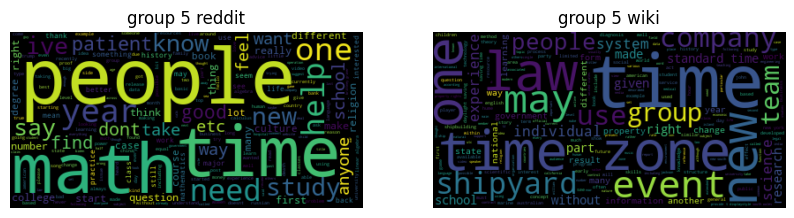

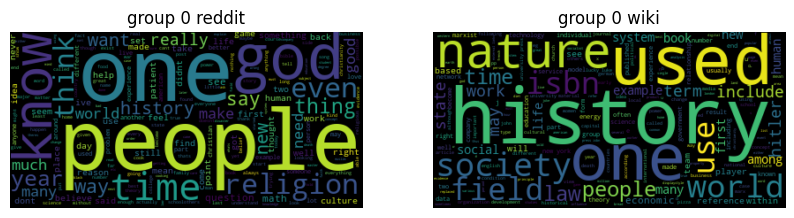

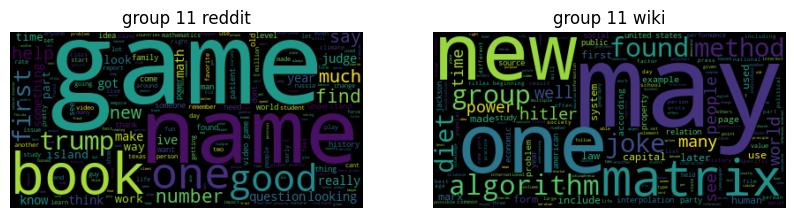

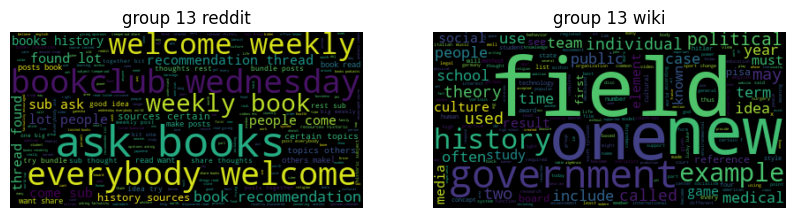

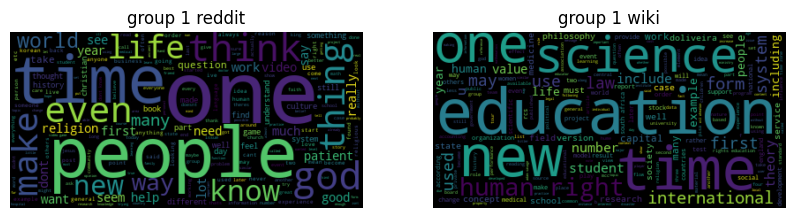

...

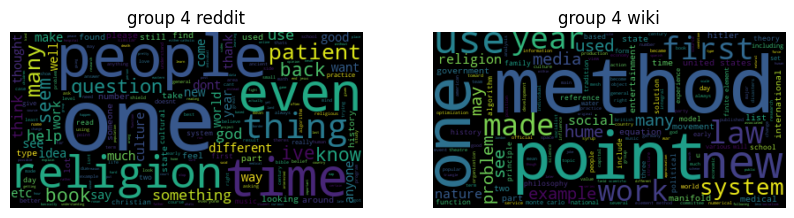

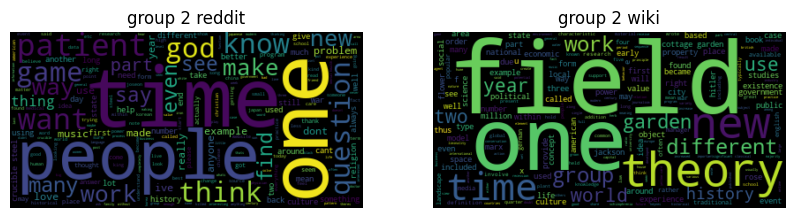

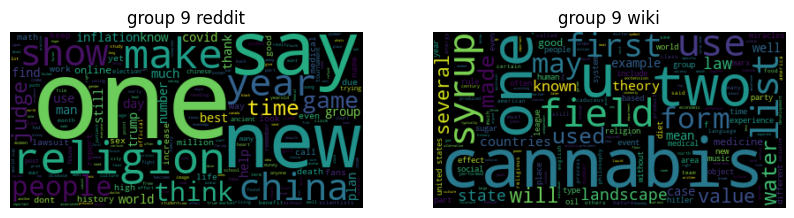

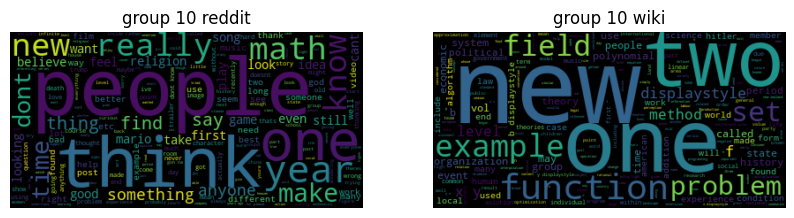

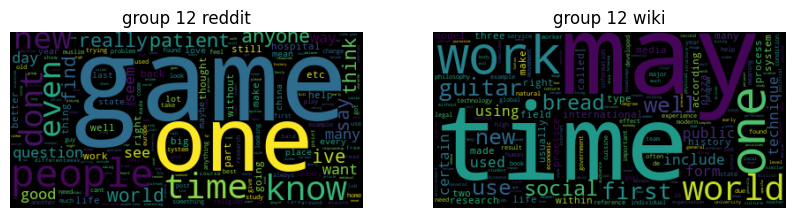

In [37]:
import warnings
warnings.filterwarnings('ignore')


for group in df.group.unique():
    text = ' '.join(df[df.group == group].text)
    text_wiki = ' '.join(df_wiki[df_wiki.group == group].text)
    wordcloud = WordCloud().generate(text)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title("group "+str(group)+" reddit")
    try:
        wordcloud2 = WordCloud().generate(text_wiki)
        plt.subplot(1, 2, 2)
        plt.imshow(wordcloud2, interpolation='bilinear')
        plt.axis("off")
        plt.title("group "+str(group)+" wiki")
    except:
        print("No wiki data for this group")
    plt.show()
#suppression warning
